In [1]:
from obspy.signal.trigger import classic_sta_lta, plot_trigger, trigger_onset

import numpy as np
import pandas as pd
from obspy import read
from datetime import datetime, timedelta
import matplotlib.pyplot as plt
import os

In [2]:
import glob
import os


def find_mseed_files(directory):
    mseed_files = glob.glob(os.path.join(directory, '**', '*.mseed'), recursive=True)
    return mseed_files


In [13]:
detect_df = pd.DataFrame(columns=['filename','time_abs(%Y-%m-%dT%H:%M:%S.%f)','time_rel(sec)'])

In [14]:
catalog_detect_df = pd.DataFrame(columns=['filename','time_abs(%Y-%m-%dT%H:%M:%S.%f)','time_rel(sec)'])

In [15]:
detect_df

,filename,time_abs(%Y-%m-%dT%H:%M:%S.%f),time_rel(sec)


In [16]:
directory = r'E:\learning\space\data\lunar\test\data'  # Change this to your target directory
mseed_files = find_mseed_files(directory)

In [17]:
len(mseed_files)

96

E:\learning\space\data\lunar\test\data\S12_GradeB\xa.s12.00.mhz.1969-12-16HR00_evid00006.mseed
xa.s12.00.mhz.1969-12-16HR00_evid00006


C:\Users\AHSYV4O\AppData\Local\Temp\ipykernel_21620\3169365458.py:91: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  catalog_detect_df = pd.concat([catalog_detect_df, detect_df_tmp], axis=0)


E:\learning\space\data\lunar\test\data\S12_GradeB\xa.s12.00.mhz.1970-01-09HR00_evid00007.mseed
xa.s12.00.mhz.1970-01-09HR00_evid00007
E:\learning\space\data\lunar\test\data\S12_GradeB\xa.s12.00.mhz.1970-02-07HR00_evid00014.mseed
xa.s12.00.mhz.1970-02-07HR00_evid00014
E:\learning\space\data\lunar\test\data\S12_GradeB\xa.s12.00.mhz.1970-02-18HR00_evid00016.mseed
xa.s12.00.mhz.1970-02-18HR00_evid00016
E:\learning\space\data\lunar\test\data\S12_GradeB\xa.s12.00.mhz.1970-03-14HR00_evid00018.mseed
xa.s12.00.mhz.1970-03-14HR00_evid00018
E:\learning\space\data\lunar\test\data\S12_GradeB\xa.s12.00.mhz.1970-03-30HR00_evid00020.mseed
xa.s12.00.mhz.1970-03-30HR00_evid00020
E:\learning\space\data\lunar\test\data\S12_GradeB\xa.s12.00.mhz.1970-04-03HR00_evid00021.mseed
xa.s12.00.mhz.1970-04-03HR00_evid00021


C:\Users\AHSYV4O\AppData\Local\Temp\ipykernel_21620\3169365458.py:65: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(1, 1, figsize=(12, 3))


E:\learning\space\data\lunar\test\data\S12_GradeB\xa.s12.00.mhz.1970-05-20HR00_evid00026.mseed
xa.s12.00.mhz.1970-05-20HR00_evid00026
E:\learning\space\data\lunar\test\data\S12_GradeB\xa.s12.00.mhz.1970-05-23HR00_evid00027.mseed
xa.s12.00.mhz.1970-05-23HR00_evid00027
E:\learning\space\data\lunar\test\data\S12_GradeB\xa.s12.00.mhz.1970-05-24HR00_evid00028.mseed
xa.s12.00.mhz.1970-05-24HR00_evid00028
E:\learning\space\data\lunar\test\data\S12_GradeB\xa.s12.00.mhz.1970-05-25HR00_evid00029.mseed
xa.s12.00.mhz.1970-05-25HR00_evid00029
E:\learning\space\data\lunar\test\data\S12_GradeB\xa.s12.00.mhz.1970-06-19HR00_evid00031.mseed
xa.s12.00.mhz.1970-06-19HR00_evid00031
E:\learning\space\data\lunar\test\data\S12_GradeB\xa.s12.00.mhz.1970-07-17HR00_evid00035.mseed
xa.s12.00.mhz.1970-07-17HR00_evid00035
E:\learning\space\data\lunar\test\data\S12_GradeB\xa.s12.00.mhz.1970-07-18HR00_evid00036.mseed
xa.s12.00.mhz.1970-07-18HR00_evid00036
E:\learning\space\data\lunar\test\data\S12_GradeB\xa.s12.00.mh

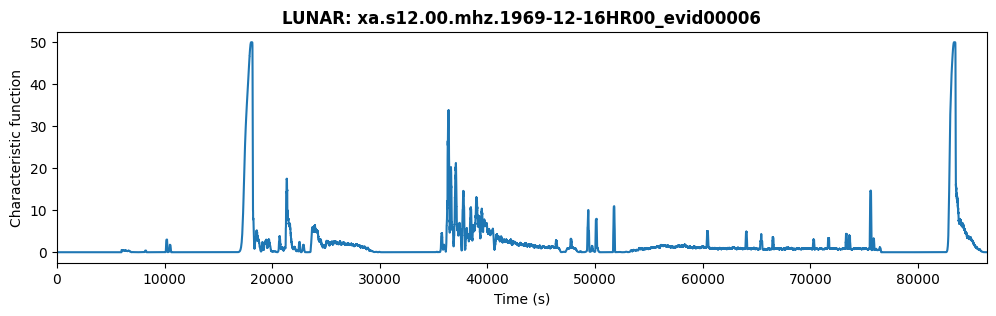

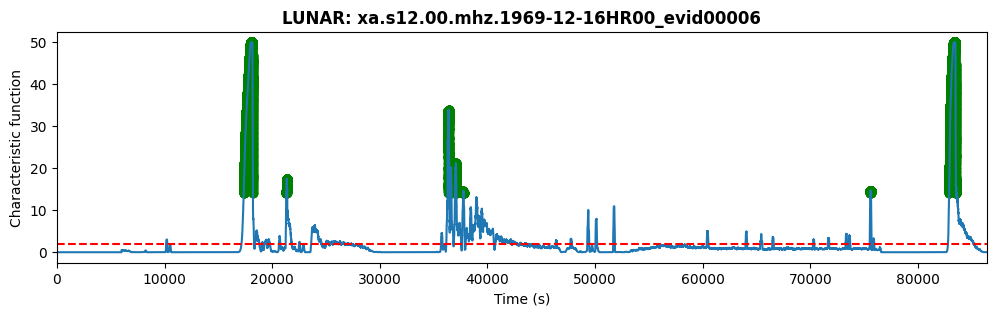

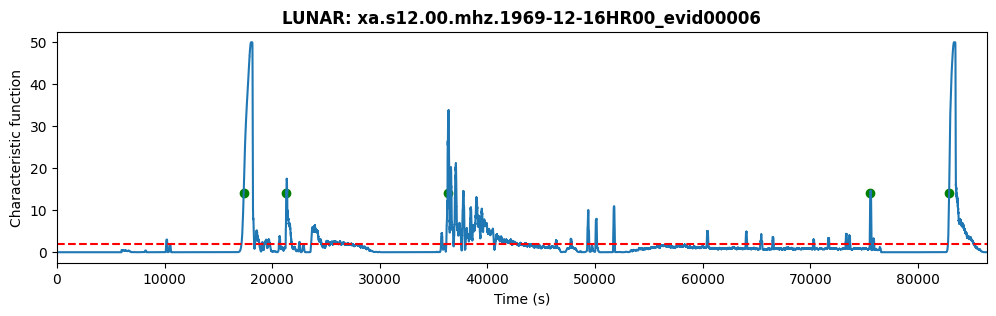

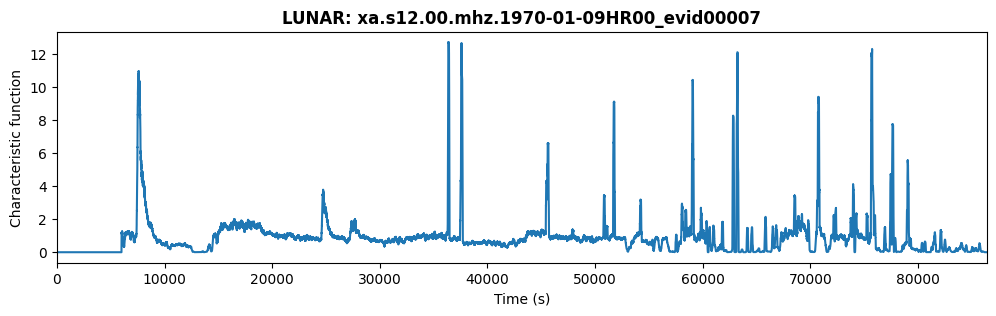

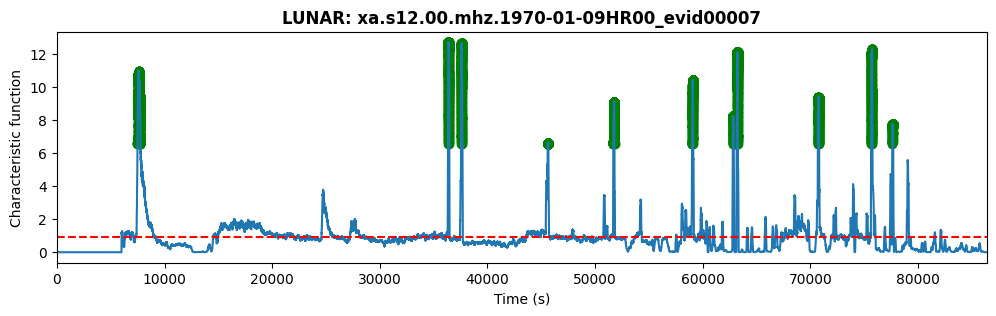

...

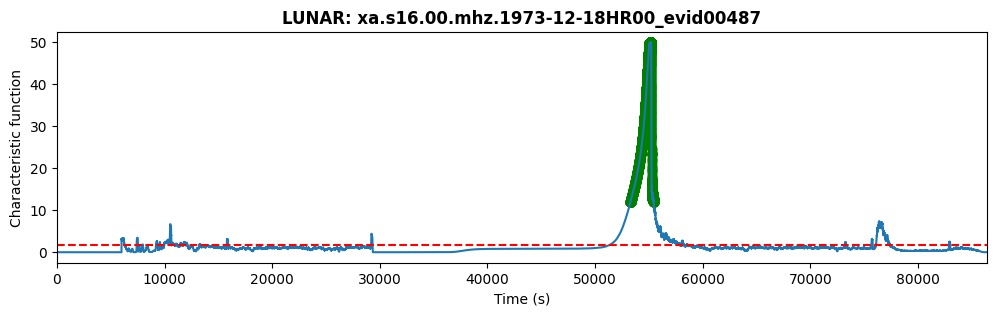

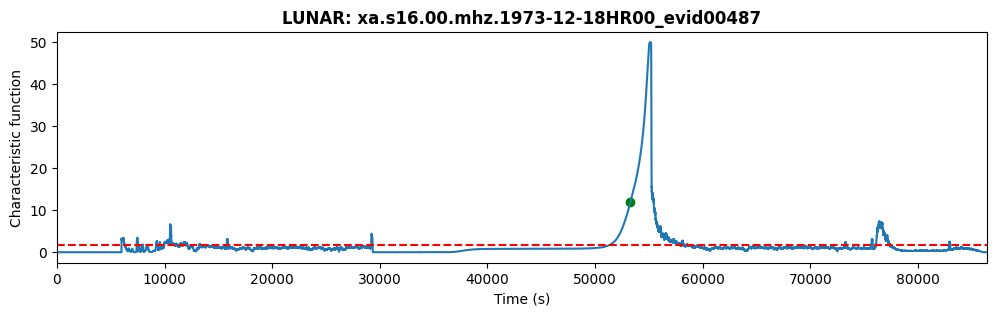

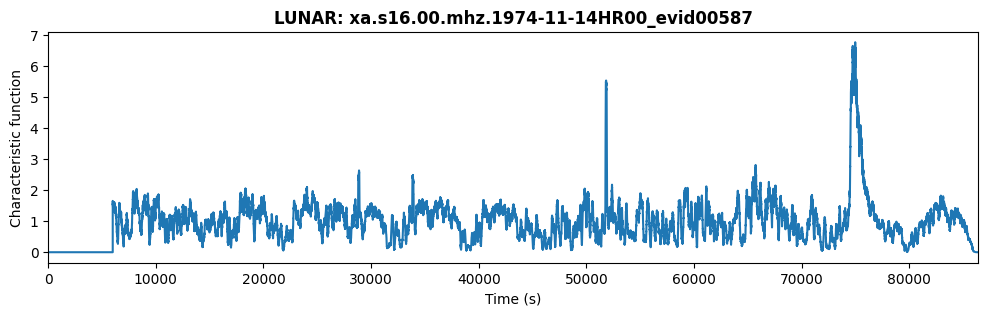

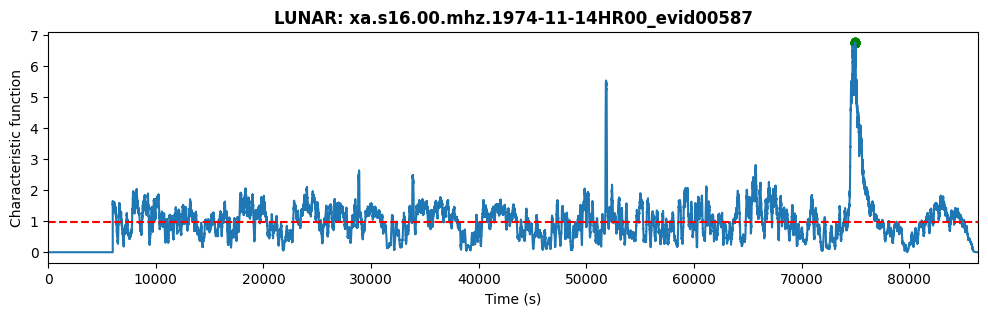

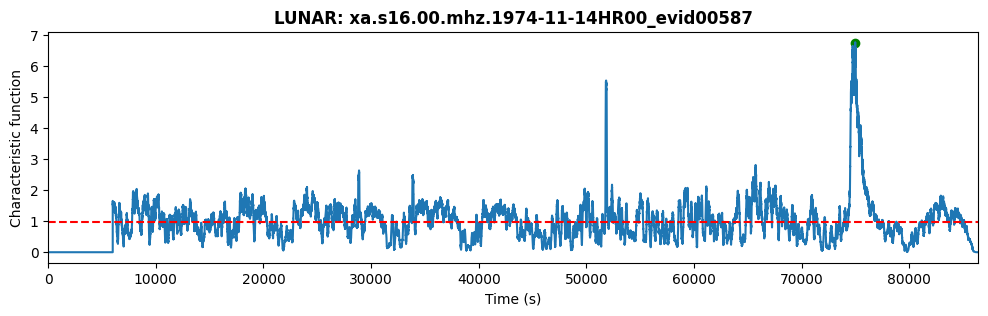

In [18]:
for filepath in mseed_files:
    print(filepath)
    mseed_file_names = os.path.splitext(os.path.basename(filepath))[0]
    print(mseed_file_names)  

    st = read(filepath)

    tr = st.traces[0].copy()
    tr_times = tr.times()
    tr_data = tr.data
    
    df = tr.stats.sampling_rate
    
    sta_len = 120
    lta_len = 6000
    

    cft = classic_sta_lta(tr_data, int(sta_len * df), int(lta_len * df))
    
    fig, ax = plt.subplots(1, 1, figsize=(12, 3))
    ax.set_title(f'LUNAR: {mseed_file_names}', fontweight='bold')
    ax.plot(tr_times, cft)
    ax.set_xlim([min(tr_times), max(tr_times)])
    ax.set_xlabel('Time (s)')
    ax.set_ylabel('Characteristic function')
    
    mean_cft = np.mean(cft)
    above_mean = cft > 7 * mean_cft
    consecutive_points = []
    for i in range(len(above_mean) - 1):
        if above_mean[i] and above_mean[i + 1]:  
            consecutive_points.append(i)
            consecutive_points.append(i + 1)
    consecutive_points = sorted(set(consecutive_points))
    fig, ax = plt.subplots(1, 1, figsize=(12, 3))
    ax.set_title(f'LUNAR: {mseed_file_names}', fontweight='bold')
    ax.plot(tr_times, cft, label='CFT')
    ax.set_xlim([min(tr_times), max(tr_times)])
    ax.set_xlabel('Time (s)')
    ax.set_ylabel('Characteristic function')
    
   
    ax.axhline(mean_cft, color='red', linestyle='--', label='Mean CFT')
    
    
    if consecutive_points:
        ax.scatter(tr_times[consecutive_points], cft[consecutive_points], color='green', label='Above Mean (Consecutive)')
    
    start_points = []
    threshold = 2000 
    
    for i in range(len(above_mean) - 1):
        if above_mean[i] and (i == 0 or not above_mean[i - 1]):
            if not start_points or (tr_times[i] - tr_times[start_points[-1]] > threshold):
                start_points.append(i)
    
    fig, ax = plt.subplots(1, 1, figsize=(12, 3))
    ax.set_title(f'LUNAR: {mseed_file_names}', fontweight='bold')
    ax.plot(tr_times, cft, label='CFT')
    ax.set_xlim([min(tr_times), max(tr_times)])
    ax.set_xlabel('Time (s)')
    ax.set_ylabel('Characteristic function')

    ax.axhline(mean_cft, color='red', linestyle='--', label='Mean CFT')
    
    if start_points:
        ax.scatter(tr_times[start_points], cft[start_points], color='green', label='Starting Points (Above Mean)')
    
    detection_times_absolut = []
    detection_times_relative = []
    triggers_start = tr_times[start_points]
    starttime = st[0].stats.starttime.datetime
    fnames = []
    for i in np.arange(0,len(triggers_start)):
        trigger = triggers_start[i]
        detection_times_relative.append(trigger)
        on_time = starttime + timedelta(seconds = trigger)
        on_time_str = datetime.strftime(on_time,'%Y-%m-%dT%H:%M:%S.%f')
        detection_times_absolut.append(on_time_str)
    detect_df_tmp = pd.DataFrame(data = {'filename':mseed_file_names, 'time_abs(%Y-%m-%dT%H:%M:%S.%f)':detection_times_absolut, 'time_rel(sec)': detection_times_relative})
    catalog_detect_df = pd.concat([catalog_detect_df, detect_df_tmp], axis=0)

In [19]:
detect_df

,filename,time_abs(%Y-%m-%dT%H:%M:%S.%f),time_rel(sec)


In [21]:
catalog_detect_df

,filename,time_abs(%Y-%m-%dT%H:%M:%S.%f),time_rel(sec)
0,xa.s12.00.mhz.1969-12-16HR00_evid00006,1969-12-16T04:49:13.234604,17353.056604
1,xa.s12.00.mhz.1969-12-16HR00_evid00006,1969-12-16T05:54:53.611962,21293.433962
2,xa.s12.00.mhz.1969-12-16HR00_evid00006,1969-12-16T10:04:51.045925,36290.867925
3,xa.s12.00.mhz.1969-12-16HR00_evid00006,1969-12-16T20:59:23.649698,75563.471698
4,xa.s12.00.mhz.1969-12-16HR00_evid00006,1969-12-16T23:01:34.668566,82894.490566
...,...,...,...
3,xa.s16.00.mhz.1973-08-25HR00_evid00443,1973-08-25T12:32:13.426189,45132.830189
4,xa.s16.00.mhz.1973-08-25HR00_evid00443,1973-08-25T13:36:46.029962,49005.433962
5,xa.s16.00.mhz.1973-08-25HR00_evid00443,1973-08-25T20:19:35.841283,73175.245283
0,xa.s16.00.mhz.1973-12-18HR00_evid00487,1973-12-18T14:47:59.623226,53279.396226


In [44]:
catalog_detect_df.to_csv('catalog_lunar.csv', index=False)

In [45]:
unique_counts = catalog_detect_df['filename'].value_counts()

In [47]:
len(unique_counts)

96

In [ ]:
#Mars

In [49]:
directory = r'E:\learning\space\data\mars\test\data' # Change this to your target directory
mseed_files = find_mseed_files(directory)

In [50]:
mseed_files

['E:\\learning\\space\\data\\mars\\test\\data\\XB.ELYSE.02.BHV.2019-05-23HR02_evid0041.mseed',
 'E:\\learning\\space\\data\\mars\\test\\data\\XB.ELYSE.02.BHV.2019-07-26HR12_evid0033.mseed',
 'E:\\learning\\space\\data\\mars\\test\\data\\XB.ELYSE.02.BHV.2019-07-26HR12_evid0034.mseed',
 'E:\\learning\\space\\data\\mars\\test\\data\\XB.ELYSE.02.BHV.2019-09-21HR03_evid0032.mseed',
 'E:\\learning\\space\\data\\mars\\test\\data\\XB.ELYSE.02.BHV.2021-05-02HR01_evid0017.mseed',
 'E:\\learning\\space\\data\\mars\\test\\data\\XB.ELYSE.02.BHV.2021-10-11HR23_evid0011.mseed',
 'E:\\learning\\space\\data\\mars\\test\\data\\XB.ELYSE.02.BHV.2021-12-24HR22_evid0007.mseed',
 'E:\\learning\\space\\data\\mars\\test\\data\\XB.ELYSE.02.BHV.2022-04-09HR22_evid0002.mseed',
 'E:\\learning\\space\\data\\mars\\test\\data\\XB.ELYSE.02.BHV.2022-05-04HR23_evid0001.mseed']

In [64]:
catalog_detect_df_mars = pd.DataFrame(columns=['filename','time_abs(%Y-%m-%dT%H:%M:%S.%f)','time_rel(sec)'])

E:\learning\space\data\mars\test\data\XB.ELYSE.02.BHV.2019-05-23HR02_evid0041.mseed
XB.ELYSE.02.BHV.2019-05-23HR02_evid0041
E:\learning\space\data\mars\test\data\XB.ELYSE.02.BHV.2019-07-26HR12_evid0033.mseed
XB.ELYSE.02.BHV.2019-07-26HR12_evid0033
E:\learning\space\data\mars\test\data\XB.ELYSE.02.BHV.2019-07-26HR12_evid0034.mseed
XB.ELYSE.02.BHV.2019-07-26HR12_evid0034
E:\learning\space\data\mars\test\data\XB.ELYSE.02.BHV.2019-09-21HR03_evid0032.mseed
XB.ELYSE.02.BHV.2019-09-21HR03_evid0032


C:\Users\AHSYV4O\AppData\Local\Temp\ipykernel_16892\1131494020.py:91: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  catalog_detect_df_mars = pd.concat([catalog_detect_df_mars, detect_df_tmp_mars], axis=0)


E:\learning\space\data\mars\test\data\XB.ELYSE.02.BHV.2021-05-02HR01_evid0017.mseed
XB.ELYSE.02.BHV.2021-05-02HR01_evid0017
E:\learning\space\data\mars\test\data\XB.ELYSE.02.BHV.2021-10-11HR23_evid0011.mseed
XB.ELYSE.02.BHV.2021-10-11HR23_evid0011
E:\learning\space\data\mars\test\data\XB.ELYSE.02.BHV.2021-12-24HR22_evid0007.mseed
XB.ELYSE.02.BHV.2021-12-24HR22_evid0007


C:\Users\AHSYV4O\AppData\Local\Temp\ipykernel_16892\1131494020.py:65: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(1, 1, figsize=(12, 3))


E:\learning\space\data\mars\test\data\XB.ELYSE.02.BHV.2022-04-09HR22_evid0002.mseed
XB.ELYSE.02.BHV.2022-04-09HR22_evid0002
E:\learning\space\data\mars\test\data\XB.ELYSE.02.BHV.2022-05-04HR23_evid0001.mseed
XB.ELYSE.02.BHV.2022-05-04HR23_evid0001


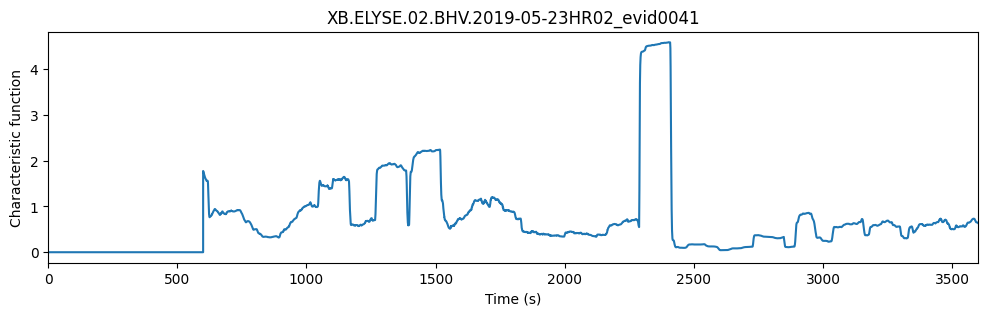

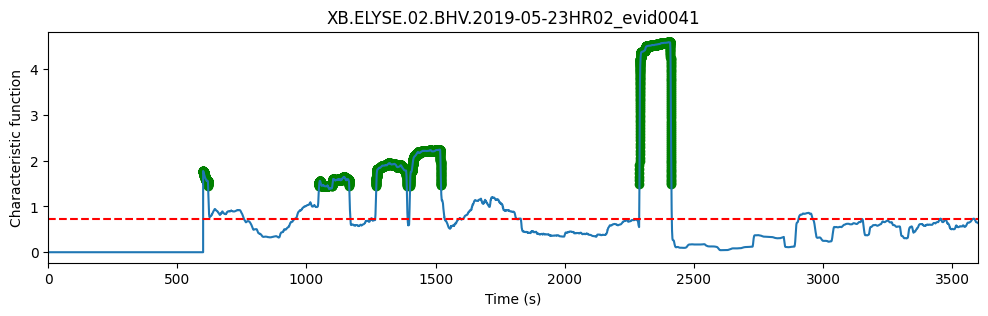

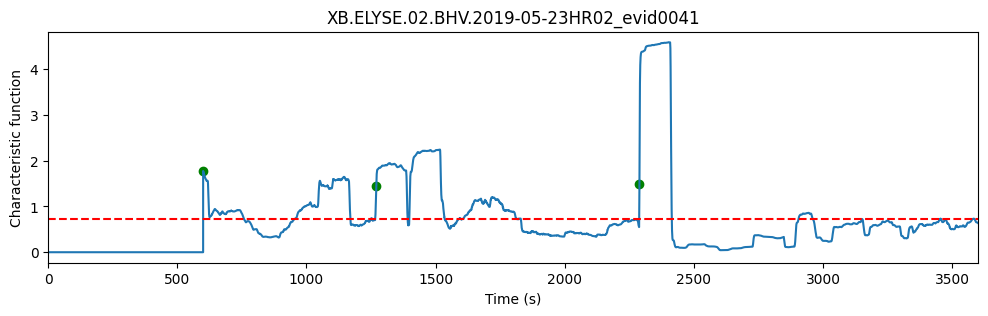

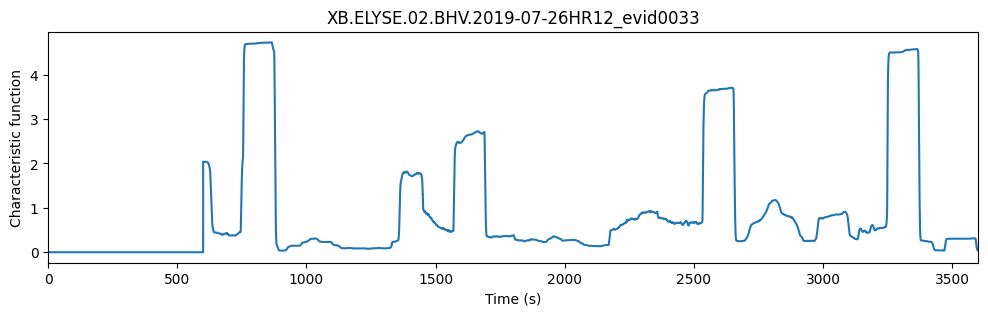

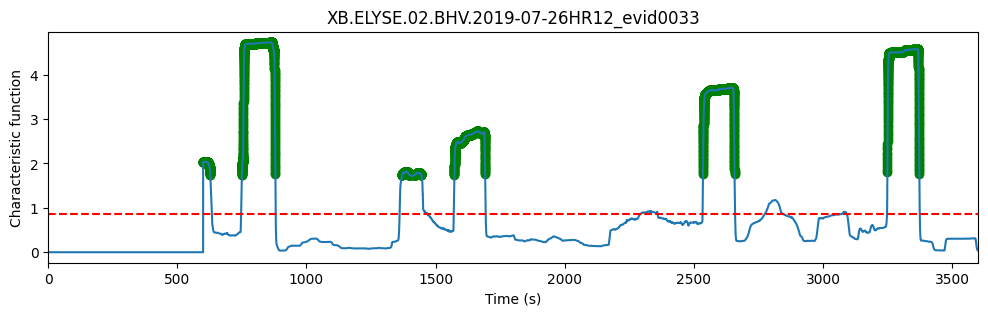

...

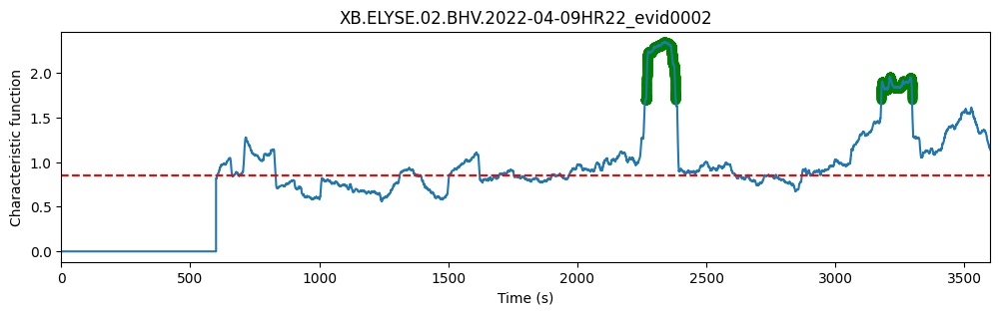

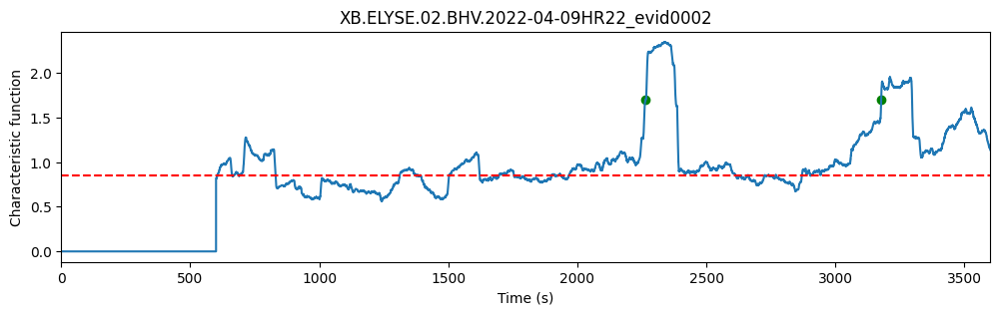

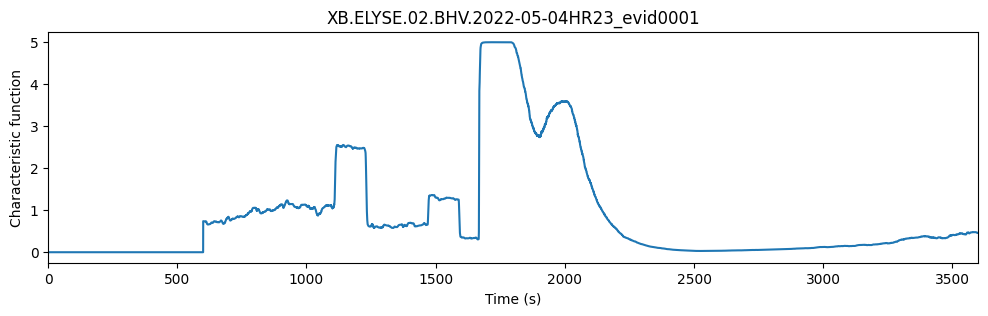

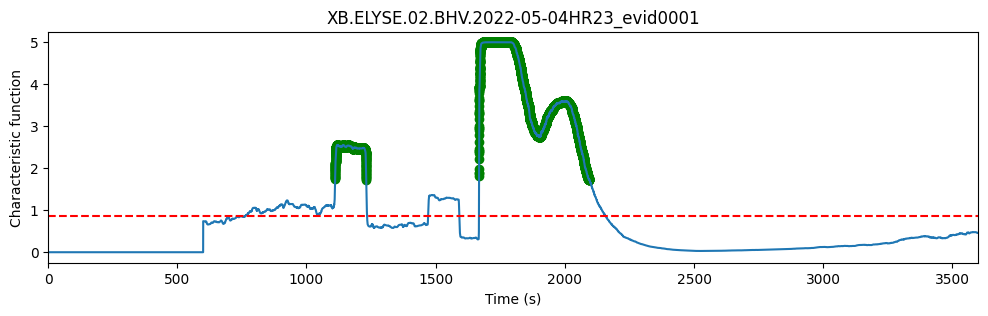

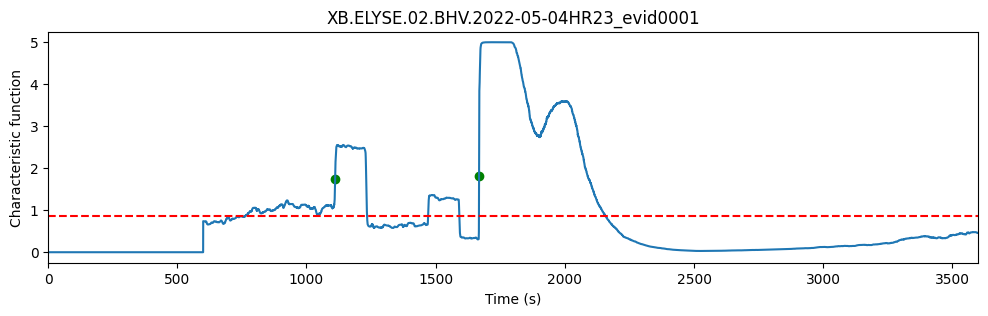

In [65]:
for filepath in mseed_files:
    print(filepath)
    mseed_file_names = os.path.splitext(os.path.basename(filepath))[0]
    print(mseed_file_names)  # Print only the filename

    st = read(filepath)

    tr = st.traces[0].copy()
    tr_times = tr.times()
    tr_data = tr.data
    
    sampling_rate = tr.stats.sampling_rate
    
    sta_len = 120
    lta_len = 600
    
    cft = classic_sta_lta(tr_data, int(sta_len * sampling_rate), int(lta_len * sampling_rate))
    
    fig, ax = plt.subplots(1, 1, figsize=(12, 3))
    ax.set_title(f'{mseed_file_names}')
    ax.plot(tr_times, cft)
    ax.set_xlim([min(tr_times), max(tr_times)])
    ax.set_xlabel('Time (s)')
    ax.set_ylabel('Characteristic function')
    
    mean_cft = np.mean(cft)
    above_mean = cft > 2 * mean_cft
    consecutive_points = []
    for i in range(len(above_mean) - 1):
        if above_mean[i] and above_mean[i + 1]:  # Check for consecutive points
            consecutive_points.append(i)
            consecutive_points.append(i + 1)
    consecutive_points = sorted(set(consecutive_points))
    fig, ax = plt.subplots(1, 1, figsize=(12, 3))
    ax.set_title(f'{mseed_file_names}')
    ax.plot(tr_times, cft, label='CFT')
    ax.set_xlim([min(tr_times), max(tr_times)])
    ax.set_xlabel('Time (s)')
    ax.set_ylabel('Characteristic function')
    
    ax.axhline(mean_cft, color='red', linestyle='--', label='Mean CFT')
    
    if consecutive_points:
        ax.scatter(tr_times[consecutive_points], cft[consecutive_points], color='green', label='Above Mean (Consecutive)')
    
    start_points = []
    threshold = 500  
    

    for i in range(len(above_mean) - 1):
        if above_mean[i] and (i == 0 or not above_mean[i - 1]):  # Check if it's a starting point
            # Check if the last point added is sufficiently far from the current one
            if not start_points or (tr_times[i] - tr_times[start_points[-1]] > threshold):
                start_points.append(i)
    
    fig, ax = plt.subplots(1, 1, figsize=(12, 3))
    ax.set_title(f'{mseed_file_names}')
    ax.plot(tr_times, cft, label='CFT')
    ax.set_xlim([min(tr_times), max(tr_times)])
    ax.set_xlabel('Time (s)')
    ax.set_ylabel('Characteristic function')
    
    ax.axhline(mean_cft, color='red', linestyle='--', label='Mean CFT')
    
    if start_points:
        ax.scatter(tr_times[start_points], cft[start_points], color='green', label='Starting Points (Above Mean)')
    
    detection_times_absolut = []
    detection_times_relative = []
    triggers_start = tr_times[start_points]
    starttime = st[0].stats.starttime.datetime
    fnames = []
    for i in np.arange(0,len(triggers_start)):
        trigger = triggers_start[i]
        detection_times_relative.append(trigger)
        on_time = starttime + timedelta(seconds = trigger)
        on_time_str = datetime.strftime(on_time,'%Y-%m-%dT%H:%M:%S.%f')
        detection_times_absolut.append(on_time_str)
    detect_df_tmp_mars = pd.DataFrame(data = {'filename':mseed_file_names, 'time_abs(%Y-%m-%dT%H:%M:%S.%f)':detection_times_absolut, 'time_rel(sec)': detection_times_relative})
    catalog_detect_df_mars = pd.concat([catalog_detect_df_mars, detect_df_tmp_mars], axis=0)

In [66]:
catalog_detect_df_mars

,filename,time_abs(%Y-%m-%dT%H:%M:%S.%f),time_rel(sec)
0,XB.ELYSE.02.BHV.2019-05-23HR02_evid0041,2019-05-23T02:09:59.982000,599.95
1,XB.ELYSE.02.BHV.2019-05-23HR02_evid0041,2019-05-23T02:21:09.832000,1269.80
2,XB.ELYSE.02.BHV.2019-05-23HR02_evid0041,2019-05-23T02:38:08.832000,2288.80
0,XB.ELYSE.02.BHV.2019-07-26HR12_evid0033,2019-07-26T12:09:59.960000,599.95
1,XB.ELYSE.02.BHV.2019-07-26HR12_evid0033,2019-07-26T12:22:50.910000,1370.90
2,XB.ELYSE.02.BHV.2019-07-26HR12_evid0033,2019-07-26T12:42:14.660000,2534.65
3,XB.ELYSE.02.BHV.2019-07-26HR12_evid0033,2019-07-26T12:54:08.510000,3248.50
0,XB.ELYSE.02.BHV.2019-07-26HR12_evid0034,2019-07-26T12:09:59.960000,599.95
1,XB.ELYSE.02.BHV.2019-07-26HR12_evid0034,2019-07-26T12:22:50.910000,1370.90
2,XB.ELYSE.02.BHV.2019-07-26HR12_evid0034,2019-07-26T12:42:14.660000,2534.65


In [67]:
catalog_detect_df_mars.to_csv('catalog_mars_predictions.csv', index=False)